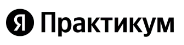

# Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

Ссылка на презентацию: <https://disk.yandex.ru/d/4W4sMKEwF6CdNQ>

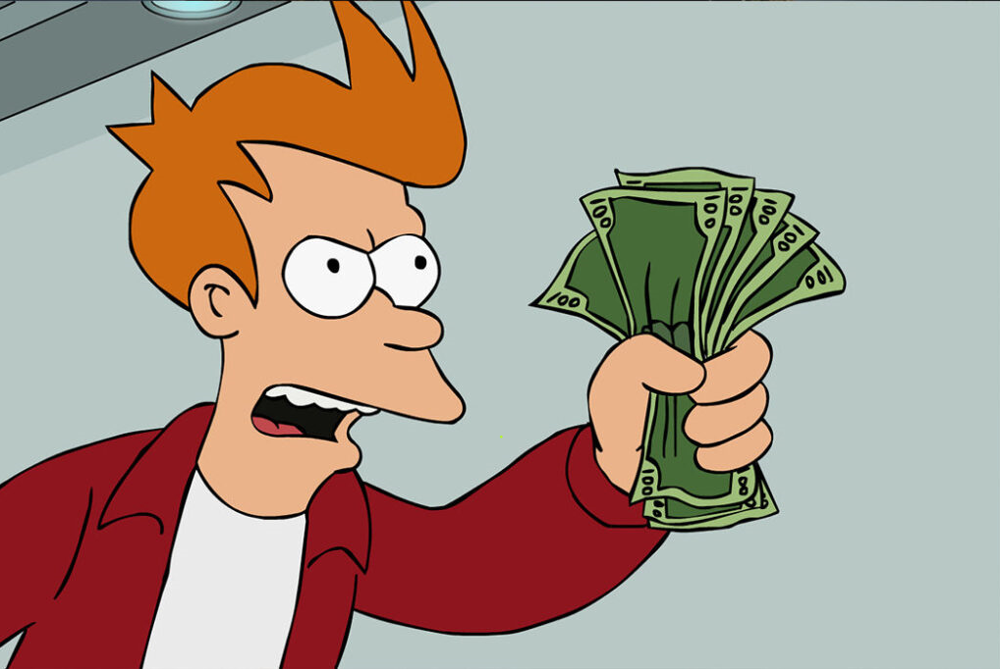

In [1]:
# Загружаем необходимые библиотеки

import os
import pandas as pd
import scipy.stats as stats
import math as mth
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
from scipy import stats as st
from plotly import graph_objects as go
from plotly.subplots import make_subplots
from pandas.plotting import register_matplotlib_converters
from statsmodels.stats.weightstats import ztest
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline
!pip install folium

## 1. Откроем файл с данными и изучим общую информацию

In [2]:
# Пути к файлам
logs_exp_path1 = '/datasets/moscow_places.csv'
logs_exp_path2 = 'C:/Users/Admin/Documents/Data_Analytic/Datasets/moscow_places.csv'


# Проверяем существование директорий и загружаем данные
if os.path.exists(logs_exp_path1):
    df = pd.read_csv(logs_exp_path1)
elif os.path.exists(logs_exp_path2):
    df = pd.read_csv(logs_exp_path2)
else:
    print('Файл не найден')

In [3]:
# Изучим структуру датесета

for i in [df]:
    display(i.head(5))
    display(i.info())
    print('Количество дубликатов:', i.duplicated().sum())
    print('Количество пропусков:\n', i.isna().sum())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

Количество дубликатов: 0
Количество пропусков:
 name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64


**Описание данных:**
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
«Средний счёт: 1000–1500 ₽»;
«Цена чашки капучино: 130–220 ₽»;
«Цена бокала пива: 400–600 ₽».
и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
0 — заведение не является сетевым
1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

<AxesSubplot:>

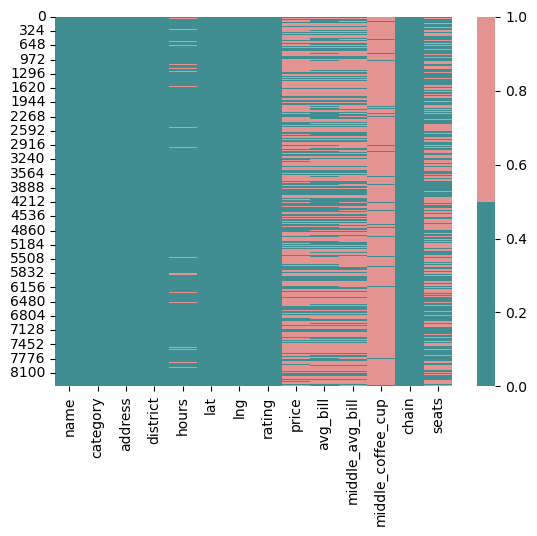

In [4]:
# Продемонстрируем пропущенные значение с помощью тепловой карты

colours = ['#408E91', '#E49393'] 
sns.heatmap(df.isnull(), cmap=sns.color_palette(colours))

In [5]:
# Посчитаем процент пропущенных значений

df.isna().mean().sort_values(ascending=False)

middle_coffee_cup    0.936355
middle_avg_bill      0.625387
price                0.605639
avg_bill             0.546039
seats                0.429574
hours                0.063764
name                 0.000000
category             0.000000
address              0.000000
district             0.000000
lat                  0.000000
lng                  0.000000
rating               0.000000
chain                0.000000
dtype: float64

**Вывод:** 
- Загрузили данные, в датасете 8406 записей и 14 столбцов. 
- Дубликаты отсутствуют, но есть много пропущенных значений, особенно в категории middle_coffee_cup - 94%. Удалять строки не будем, потеряется значительная доля необходимых для исследования сведений.

## 2. Выполним предобработку данных

In [6]:
# Приведем записи к нижнему регистру

df['name'] = df['name'].str.lower()
df['address'] = df['address'].str.lower()
#df = df.applymap(lambda x: x.lower() if type(x) == str else x)

In [7]:
# Удалим появившиеся дубликаты

df.drop_duplicates(subset=['name', 'address'], inplace=True)

In [8]:
# Удалим записи где пропущены значения в столбце hours, таких записей около 6%

df.dropna(subset=['hours'], inplace=True)

In [9]:
# Создадим столбец street с названиями улиц из столбца с адресом.
df['street'] = df['address'].apply(lambda x: x.split(',')[1].strip())

# Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
df['is_24/7'] = df['hours'].str.contains('круглосуточно', case=False)

In [10]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


In [11]:
# Воспользуемся методом описательной статистики

df.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,7867.000000,7867.000000,7867.000000,3143.000000,534.000000,7867.000000,4493.000000
mean,55.750724,37.608055,4.244299,957.886096,174.514981,0.392399,107.818607
std,0.068751,0.096823,0.452896,1010.508023,88.906040,0.488316,119.221227
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.706883,37.539924,4.100000,375.000000,124.250000,0.000000,40.000000
50%,55.754221,37.604923,4.300000,750.000000,168.000000,0.000000,75.000000
75%,55.794421,37.662863,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


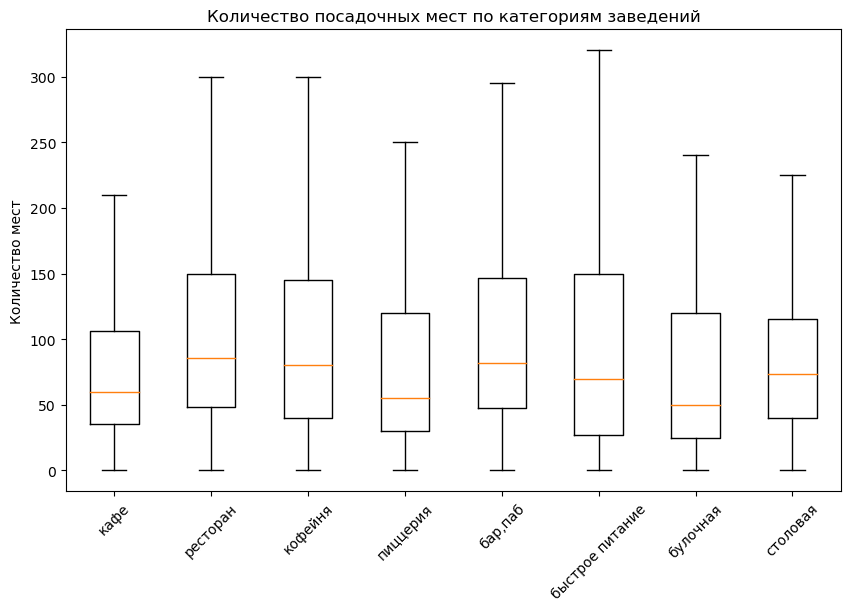

In [12]:
fig, ax = plt.subplots(figsize=(10,6))

ax.set_title('Количество посадочных мест по категориям заведений')
ax.set_ylabel('Количество мест')

boxplot = ax.boxplot([df[df['category']==c]['seats'].dropna() for c in df['category'].unique()], labels=df['category'].unique(), showfliers=False)

plt.xticks(rotation=45)
plt.show()

# График можно сохранить в файл, вызвав функцию plt.savefig('имя_файла.png')

**Вывод:** 
- Привели названия заведений и улиц к нижнему регистру, чтобы выявить неявные дубликаты. Удалили незначительную доли строк с пропущенными значениями в категории hours.
- Создали столбцы с названием улицы заведения и работает ли заведение в круглосуточном режиме.
- Определили наличие выбросов в количестве посадочных мест, вероятно это связано с ошибкой при вводе данных.

## 3. Анализируем данные

### 3.1 Какие категории заведений представлены в данных? Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. Ответим на вопрос о распределении заведений по категориям.

In [13]:
# Создадим список категорий
category_counts = df['category'].value_counts()

# Строим столбчатую диаграмму 
fig = px.bar(category_counts, # загружаем данные и заново их сортируем
             text = category_counts.values, # добавляем аргумент, который отобразит текст с информацией
                                                # о количестве объявлений внутри столбца графика
             color_discrete_sequence=['#408E91']
            )
# Оформляем график
fig.update_layout(title='Количество заведений по категориям',
                  xaxis_title='Категория заведения',
                  yaxis_title='Количество',
                  showlegend=False)
fig.show() # Выводим график

**Вывод:** Выделили три категории заведений по количеству объектов
- Кафе - 2002 заведения.
- Ресторан - 1968 заведений.
- Кофейня - 1398 заведений.

### 3.2 Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. Проанализируем результаты и сделаем выводы.

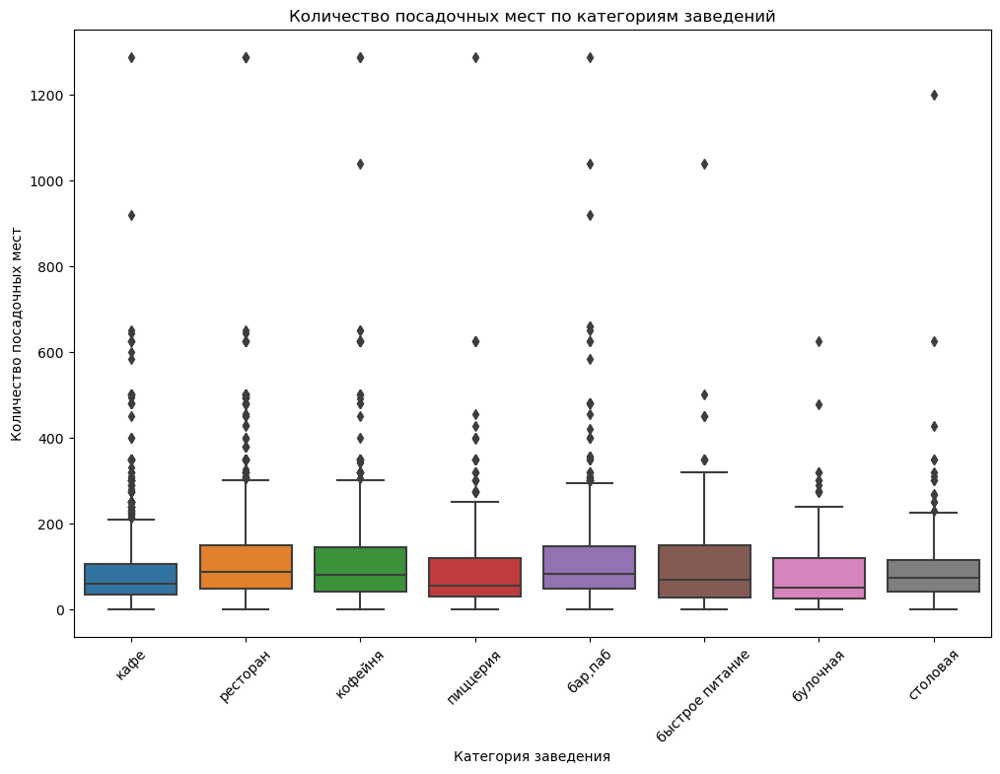

In [14]:
plt.figure(figsize=(12,8))
sns.boxplot(x='category', y='seats', data=df)
plt.title('Количество посадочных мест по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Количество посадочных мест')
plt.xticks(rotation=45)
plt.show()

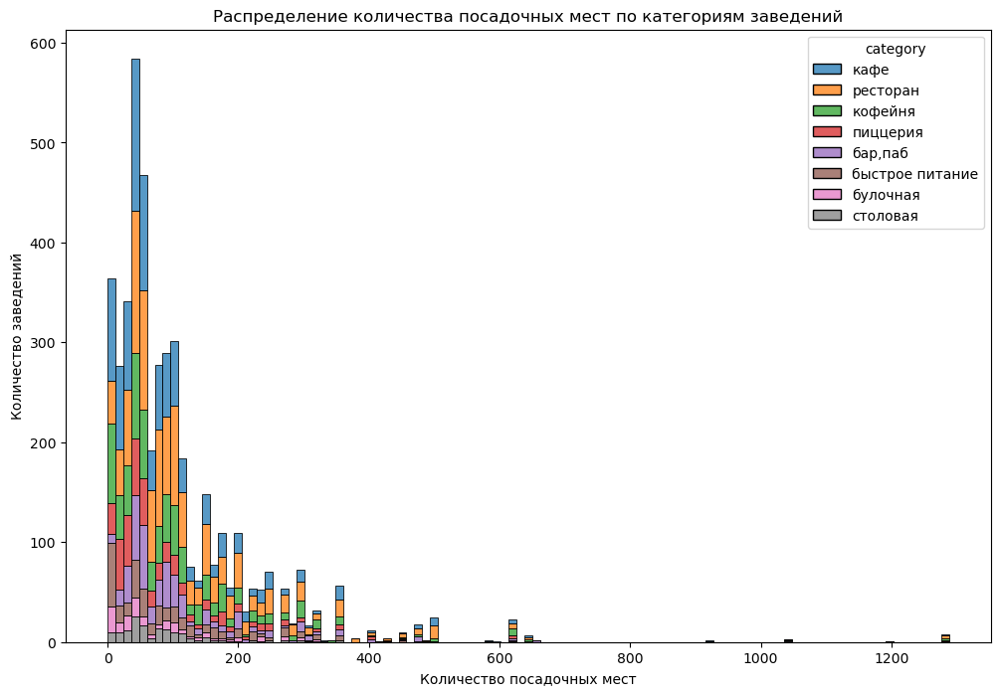

In [15]:
plt.figure(figsize=(12,8))
sns.histplot(x='seats', data=df, hue='category', multiple='stack')
plt.title('Распределение количества посадочных мест по категориям заведений')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Количество заведений')
plt.show()

**Вывод:** 
- При открытии заведения общественного питания, следует ориентироваться на количество посадочных мест, если предприниматель планирует открыть ресторан, кофейню или пункт быстрого питания то для этих типов заведений необходимо самое большое количество посадочных мест. Не так требовательны к количеству мест булочные и пиццерии.

### 3.3 Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [16]:
# создаем сводную таблицу
networks = df.pivot_table(index='category', columns='chain', values='name', aggfunc='count')

# переименовываем колонки
networks.columns = ['несетевые', 'сетевые']

# заполняем пропуски нулями
networks.fillna(0, inplace=True)

# считаем общее количество заведений в каждой категории
total = networks.sum(axis=1)

# добавляем колонку с долей сетевых заведений
networks['доля сетевых'] = networks['сетевые'] / total

# выводим сводную таблицу
print(networks)

                 несетевые  сетевые  доля сетевых
category                                         
бар,паб                588      158      0.211796
булочная                95      154      0.618474
быстрое питание        346      224      0.392982
кафе                  1291      711      0.355145
кофейня                684      714      0.510730
пиццерия               298      330      0.525478
ресторан              1257      711      0.361280
столовая               221       85      0.277778


In [17]:
# создаем список фигур
figs = []

# проходимся по каждой категории
for category in df['category'].unique():

    # создаем фигуру
    fig = go.Figure(layout=dict(width=400, height=400))
    

    # добавляем круговую диаграмму
    fig.add_trace(go.Pie(
        labels=['несетевые', 'сетевые'],
        values=networks.loc[category, ['несетевые', 'сетевые']],
        hole=0.3,
        marker_colors=['#E49393', '#408E91'],
        textinfo='percent',
        textposition='inside'
    ))

    # настраиваем макет
    fig.update_layout(
        title=category,
        font=dict(size=12),
        showlegend=True
    )
    
    # добавляем фигуру в список
    figs.append(fig)

# отображаем фигуры
for fig in figs:
    fig.show()

**Вывод:** 
- Предприниматель планирующий запустить собственный бизнес как правило открывает кафе или ресторан. Этих заведений больше всего в категории несетевых.
- При открытии сети пунктов питания или покупке франшизы можно обратить внимание на заведения типа кафе, кофейни или ресторана - таких заведений больше всего в категории сетевых
- Для баров, пабов и столовых характерен индивидуальных подход, у данных заведений меньше всего присутствует признак сетевых.
- Среди булочных, кофеен и пиццерий самая высокая доля сетей.

### 3.4 Какие категории заведений чаще являются сетевыми? Исследуем данные и ответим на вопрос графиком

In [18]:
# создаем сводную таблицу
networks_by_category = df.pivot_table(index='category', values='name', 
                                      columns='chain', aggfunc='count', fill_value=0)

# считаем долю сетевых заведений в каждой категории
networks_by_category['percent_network'] = networks_by_category[1] / \
                                          (networks_by_category[0] + networks_by_category[1]) * 100

# сбрасываем индекс для удобства построения графика
networks_by_category = networks_by_category.reset_index().sort_values(by='percent_network', ascending=False)

# строим график
fig = px.bar(networks_by_category, x='category', y='percent_network', 
             color='percent_network', color_continuous_scale='greens')

# настраиваем оси и заголовок
fig.update_xaxes(title='Категория')
fig.update_yaxes(title='Доля сетевых заведений, %')
fig.update_layout(title='Доля сетевых заведений по категориям')

# выводим график
fig.show()
networks_by_category

chain,category,0,1,percent_network
1,булочная,95,154,61.847390
5,пиццерия,298,330,52.547771
4,кофейня,684,714,51.072961
2,быстрое питание,346,224,39.298246
6,ресторан,1257,711,36.128049
3,кафе,1291,711,35.514486
7,столовая,221,85,27.777778
0,"бар,паб",588,158,21.179625


**Вывод:** Тип заведений, у которых самая высокая доля сетей:
- Булочная - 62%
- Пиццерия - 53%
- Кофейня - 51%

### 3.5 Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Построем подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [19]:
top_chains = (
    df[df['chain'] == 1]
    .groupby('name')
    .agg({'name': 'count'})
    .rename(columns={'name': 'total_count'})
    .sort_values(by='total_count', ascending=False)
    .head(15)
)
top_chains

,total_count
name,
шоколадница,120
домино'с пицца,76
додо пицца,74
one price coffee,71
яндекс лавка,68
cofix,65
prime,50
кофепорт,42
кулинарная лавка братьев караваевых,39


In [20]:
fig = px.bar(top_chains,
             y=top_chains.index,
             x='total_count',
             height=700,
             width=1000
             )
fig.update_layout(title = 'Топ популярных сетевых заведений Москвы',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Название сети',
                  showlegend = False)
fig.show()

**Вывод:** Действительно, в списке самые узнаваемые сетевые заведения. Рассмотрим на примерах особенности сетей. Для Шоколадницы характерно удобное расположение, как правило возле станций метро и в торговых центрах, это позволяет собрать максимально большое количество трафика. Пиццерии борятся между собой по скорости доставки. Кофейни предлагают качество и скорость обслуживания и гибкую систему лояльности, предполагающую ежедневное потребление кофе, чем чаще покупки тем дешевле чашка кофе. Но вероятнее всего заведения оказались в нашем списке поскольку имеют самые большие расходы на рекламу, для поддержки узнаваемости.

### 3.6 Какие административные районы Москвы присутствуют в датасете? Отобразим общее количество заведений и количество заведений каждой категории по районам. Попробуем проиллюстрировать эту информацию одним графиком.

In [21]:
district_category_counts = df.pivot_table(index='district', columns='category', values='name', aggfunc='count', fill_value=0)
district_category_counts['total'] = district_category_counts.sum(axis=1)
district_category_counts.sort_values(by='total', ascending=False)

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
district,,,,,,,,,
Центральный административный округ,364,50,85,444,426,112,665,65,2211
Северный административный округ,65,37,54,205,191,76,178,38,844
Северо-Восточный административный округ,56,28,79,229,157,66,174,40,829
Южный административный округ,65,25,81,215,130,73,195,43,827
Западный административный округ,48,36,60,191,148,71,207,24,785
Восточный административный округ,51,23,66,218,102,71,153,39,723
Юго-Западный административный округ,37,26,57,196,94,64,159,17,650
Юго-Восточный административный округ,37,12,61,218,88,55,135,23,629
Северо-Западный административный округ,23,12,27,86,62,40,102,17,369


In [22]:
# Сортируем данные по общему количеству заведений в районе
district_category_counts = district_category_counts.sort_values(by='total', ascending=False)

# Создаем список с данными для каждой категории
data = []
for category in district_category_counts.columns[:-1]:
    data.append(
        go.Bar(
            x=district_category_counts[category],
            y=district_category_counts.index,
            name=category,
            orientation='h'
        )
    )

# Создаем график
layout = go.Layout(
    barmode='stack',
    height=500,
    width=1000,
    margin=dict(l=120, r=50, t=50, b=50),
    xaxis=dict(title='Количество заведений'),
    yaxis=dict(title='Район'),
    title='Количество заведений в каждом районе по категориям'
)

fig = go.Figure(data=data, layout=layout)

# Отображаем график
fig.show()


**Вывод:** Город разделен на девять районов, проанализировали количество заведений в каждом районе. Более чем с двухкратным отрывом по количеству заведений - Центральный район города (2211 заведений)

### 3.7 Визуализируем распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [23]:
fig = px.box(df, x='category', y='rating', color='category', points='all', hover_data=['name'])
fig.show()

**Вывод:** Рейтинги по медианному значению среди заведений составляет - 4.3, с небольшим отрывом 4.4 рейтинг в категории бар, паб.

### 3.8 Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [24]:
# Для каждого округа посчитаем медианный рейтинг торговых центров, которые находятся на его территории

rating_df = df.groupby('district', as_index=False)['rating'].agg('mean').round(2)
rating_df

,district,rating
0,Восточный административный округ,4.19
1,Западный административный округ,4.19
2,Северный административный округ,4.25
3,Северо-Восточный административный округ,4.16
4,Северо-Западный административный округ,4.24
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.12
7,Юго-Западный административный округ,4.19
8,Южный административный округ,4.19


In [25]:
# подключаем модуль для работы с JSON-форматом
import json

# читаем файл и сохраняем в переменной
with open('C:/Users/Admin/Documents/Data_Analytic/Datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [26]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='GnBu',
    fill_opacity=0.6,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**Вывод:** Построили фоновую картограмму с рейтингами по районам. Самый высокий рейтинг в Центральном административном округе - 4.38 и Северном административном округе - 4.34.

### 3.9 Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium

In [27]:
# импортируем маркер
from folium import Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

**Вывод:** С помощью библиотеки folim удобно пользоваться навигацией по городу и изучать расположение заведений. На карте видно, что больше всего заведений расположено в цетральной части города

### 3.10 Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [28]:
top_streets = df['street'].value_counts().head(15).index.tolist()
top_streets

['проспект мира',
 'профсоюзная улица',
 'проспект вернадского',
 'ленинский проспект',
 'ленинградский проспект',
 'дмитровское шоссе',
 'каширское шоссе',
 'варшавское шоссе',
 'ленинградское шоссе',
 'люблинская улица',
 'кутузовский проспект',
 'улица вавилова',
 'мкад',
 'пятницкая улица',
 'улица миклухо-маклая']

In [29]:
street_category_counts = df[df['street'].isin(top_streets)].groupby(['street', 'category'])['name'].count().reset_index(name='count')
street_category_counts

,street,category,count
0,варшавское шоссе,"бар,паб",6
1,варшавское шоссе,быстрое питание,7
2,варшавское шоссе,кафе,12
3,варшавское шоссе,кофейня,13
4,варшавское шоссе,пиццерия,4
...,...,...,...
105,улица миклухо-маклая,быстрое питание,4
106,улица миклухо-маклая,кафе,18
107,улица миклухо-маклая,кофейня,4
108,улица миклухо-маклая,пиццерия,2


In [30]:
fig = go.Figure()

for street in top_streets:
    street_data = street_category_counts[street_category_counts['street'] == street]
    fig.add_trace(go.Bar(
        x=street_data['category'],
        y=street_data['count'],
        name=street
    ))

fig.update_layout(
    title='Распределение заведений по улицам и категориям',
    xaxis_title='Категория',
    yaxis_title='Количество заведений',
    barmode='group',
    bargap=0.15,
    bargroupgap=0.1
)

fig.show()

**Вывод:** Определили улицы на которых больше всего окрытых заведений. Лидер по количеству открытых заведений почти во всех категориях - проспект Мира. Далее улица Профсоюзная и проспект Вернадского.

### 3.11 Найдем улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [31]:
# Сгруппируем данные по улицам и посчитаем количество заведений на каждой улице
street_counts = df['street'].value_counts().reset_index()
street_counts.columns = ['street', 'count']

# Оставим только улицы с одним заведением
one_place_streets = street_counts[street_counts['count'] == 1]['street']

# Выберем только заведения, которые находятся на этих улицах
one_place_df = df[df['street'].isin(one_place_streets)]
one_place_df = one_place_df[['name', 'lat', 'lng', 'street']].reset_index()
one_place_df

,index,name,lat,lng,street
0,15,дом обеда,55.885890,37.493264,улица бусиновская горка
1,19,пекарня,55.887969,37.515688,ижорский проезд
2,21,7/12,55.876805,37.464934,прибрежный проезд
3,25,в парке вкуснее,55.878453,37.460028,парк левобережный
4,58,coffeekaldi's,55.900316,37.570558,угличская улица
...,...,...,...,...,...
465,8317,беседка,55.690691,37.787735,кузьминская улица
466,8349,вкусные традиции,55.702668,37.848193,лермонтовский проспект
467,8379,лагман хаус,55.678772,37.759422,новороссийская улица
468,8393,doner pro,55.705155,37.736415,11-я улица текстильщиков


In [32]:
# Создаем объект карты
m = folium.Map(location=[55.7558, 37.6173], zoom_start=9.5)

# Создаем объект кластеров
cluster = MarkerCluster().add_to(m)

# Добавляем маркеры для каждого заведения
for i, row in one_place_df.iterrows():
    folium.Marker(location=[row['lat'], row['lng']], popup=row['name']).add_to(cluster)

# Отображаем карту
m

In [33]:
# Посчитаем какой тип заведения чаще встречается на улицах с одним объектом
single_object_streets = df[df['street'].isin(one_place_streets)]
top_categories_single_object_streets = single_object_streets['category'].value_counts().head(3)
top_categories_single_object_streets

кафе        149
ресторан     97
кофейня      91
Name: category, dtype: int64

**Вывод:** Нашли 470 улиц на которых находится только одно заведение. С помощью кластеров отобразили заведения на карте, больше всего среди таких заведение - кафе.

### 3.12 Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого района. Используем это значение в качестве ценового индикатора района. Построем фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируем цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [34]:
# Для каждого округа посчитаем медианный рейтинг торговых центров, которые находятся на его территории

middle_avg_bill_df = df.groupby('district', as_index=False)['middle_avg_bill'].agg('median').round(2)
middle_avg_bill_df

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [35]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='GnBu',
    fill_opacity=0.6,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**Вывод:** Как видим из фоновой картограммы, самый высокий средний чек в Цетральном и Западном районах, он превышает в два раза значение среднего чего в сравнении с другими районами города.

### 3.13 Общий вывод

- Проанализировали заведения города Москвы, выделили три категории заведений по количеству объектов: кафе - 2002 заведения, ресторан - 1968 заведений, кофейня - 1398 заведений.

- При открытии заведения общественного питания, следует ориентироваться на количество посадочных мест, если предприниматель планирует открыть ресторан, кофейню или пункт быстрого питания то для этих типов заведений необходимо самое большое количество посадочных мест. Не так требовательны к количеству мест булочные и пиццерии.

- Предприниматель планирующий запустить собственный бизнес как правило открывает кафе или ресторан. Этих заведений больше всего в категории несетевых. При открытии сети пунктов питания или покупке франшизы можно обратить внимание на заведения типа кафе, кофейни или ресторана - таких заведений больше всего в категории сетевых. Для баров, пабов и столовых характерен индивидуальных подход, у данных заведений меньше всего присутствует признак сетевых. Среди булочных, кофеен и пиццерий самая высокая доля сетей.

- Тип заведений, у которых самая высокая доля сетей: булочная - 62%, пиццерия - 53%, кофейня - 51%

- Рассмотрим на примерах особенности сетей. Для Шоколадницы характерно удобное расположение, как правило возле станций метро и в торговых центрах, это позволяет собрать максимально большое количество трафика. Пиццерии борятся между собой по скорости доставки. Кофейни предлагают качество и скорость обслуживания и гибкую систему лояльности, предполагающую ежедневное потребление кофе, чем чаще покупки тем дешевле чашка кофе. Но вероятнее всего заведения оказались в нашем списке поскольку имеют самые большие расходы на рекламу, для поддержки узнаваемости.

- Город разделен на девять районов, проанализировали количество заведений в каждом районе. Более чем с двухкратным отрывом по количеству заведений - Центральный район города (2211 заведений)

- Рейтинги по медианному значению среди заведений составляет - 4.3, с небольшим отрывом 4.4 рейтинг в категории бар, паб.

- Построили фоновую картограмму с рейтингами по районам. Самый высокий рейтинг в Центральном административном округе - 4.38 и Северном административном округе - 4.34.

- С помощью библиотеки folim удобно пользоваться навигацией по городу и изучать расположение заведений. На карте видно, что больше всего заведений расположено в цетральной части города

- Определили улицы на которых больше всего окрытых заведений. Лидер по количеству открытых заведений почти во всех категориях - проспект Мира. Далее улица Профсоюзная и проспект Вернадского.

- Нашли 470 улиц на которых находится только одно заведение. С помощью кластеров отобразили заведения на карте, больше всего среди таких заведение - кафе.

- Как видим из фоновой картограммы, самый высокий средний чек в Цетральном и Западном районах, он превышает в два раза значение среднего чего в сравнении с другими районами города.

## Шаг 4. Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

**Ответим на следующие вопросы:**

### 4.1 Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [36]:
# Выбираем только кофейни
coffee_df = df[df['category'] == 'кофейня']

# Считаем количество кофеен
coffee_count = len(coffee_df)
print(f'В датасете всего {coffee_count} кофеен.')

# Группируем данные по районам и считаем количество кофеен в каждом районе
coffee_by_district = coffee_df.groupby('district')['name'].count().reset_index()
coffee_by_district.columns = ['district', 'coffee_count']
coffee_by_district = coffee_by_district.sort_values(by='coffee_count', ascending=False)

# Выводим информацию о районах с наибольшим количеством кофеен
print('\nТоп-10 районов по количеству кофеен:')
print(coffee_by_district.head(10))



В датасете всего 1398 кофеен.

Топ-10 районов по количеству кофеен:
                                  district  coffee_count
5       Центральный административный округ           426
2          Северный административный округ           191
3  Северо-Восточный административный округ           157
1          Западный административный округ           148
8             Южный административный округ           130
0         Восточный административный округ           102
7      Юго-Западный административный округ            94
6     Юго-Восточный административный округ            88
4   Северо-Западный административный округ            62


In [37]:
# Создаем объект карты
m = folium.Map(location=[55.7558, 37.6173], zoom_start=9.5)

# Создаем объект кластеров
cluster = MarkerCluster().add_to(m)

# Добавляем маркеры для каждого заведения
for i, row in coffee_df.iterrows():
    folium.Marker(location=[row['lat'], row['lng']], popup=row['name']).add_to(cluster)

# Отображаем карту
m

### 4.2 Есть ли круглосуточные кофейни?

In [38]:
coffee_24 = coffee_df[coffee_df['is_24/7'] == True]
print('Количество круглосуточных кофеен:', len(coffee_24))
print('Доля круглосуточных: {:.2%}'.format(len(coffee_24) / coffee_count))

Количество круглосуточных кофеен: 76
Доля круглосуточных: 5.44%


In [39]:
# Создаем объект карты
m = folium.Map(location=[55.7558, 37.6173], zoom_start=9.5)

# Создаем объект кластеров
cluster = MarkerCluster().add_to(m)

# Добавляем маркеры для каждого заведения
for i, row in coffee_24.iterrows():
    folium.Marker(location=[row['lat'], row['lng']], popup=row['name']).add_to(cluster)

# Отображаем карту
m

### 4.3 Какие у кофеен рейтинги? Как они распределяются по районам?

In [40]:
# Для каждого округа посчитаем медианный рейтинг торговых центров, которые находятся на его территории

rating_cafe = coffee_df.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values('rating', ascending=False)
rating_cafe

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.27
8,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.22
3,Северо-Восточный административный округ,4.21
1,Западный административный округ,4.19


### 4.4 На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [41]:
# Для каждого округа посчитаем среднюю стоимость чашки копучино

middle_cup_df = coffee_df.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean').round(2)
middle_cup_df

,district,middle_coffee_cup
0,Восточный административный округ,174.02
1,Западный административный округ,189.94
2,Северный административный округ,165.79
3,Северо-Восточный административный округ,165.33
4,Северо-Западный административный округ,165.52
5,Центральный административный округ,186.91
6,Юго-Восточный административный округ,151.09
7,Юго-Западный административный округ,184.18
8,Южный административный округ,158.49


In [42]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_cup_df,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='GnBu',
    fill_opacity=0.6,
    legend_name='Средняя стоимость чашки капучино по районам',
).add_to(m)

# выводим карту
m

**Вывод:** 
- Исследовали особенности характерные для кафеен. В Москве 1398 заведений данного типа, больше всего которых расположены в Центральном административном округе, только 5% работают круглосуточно. Средняя стоимость чашки кофе незначительно выше в трех административных районах - Центральном, Западном и Восточном.
- Основателям фонда мечтающим открыть кофейню в центре города, не стоит бояться конкуренции, ведь страсть людей к кофе и необычнам местам с особенной атмосферой только растет. Только необходимо обратить внимание на ряд особенностей при открытии кофейни. Прежде всего рейтинг заведения, у кофеен в центре города самый высокий рейтинг, это означает что владельцы тщательно следят за процессами на каждом этапе работы заведения, начиная от качества работы поставщиков и заканчивая тем, как сотрудники взаимодествуют с посетителями. Просчитать экономику кофейни при установленной стоимости чашки капучино 180-190 рублей. Установить круглосуточный режим работы.